<a href="https://colab.research.google.com/github/nhorro/DesafioAgTech2020/blob/master/SolucionModeloFinal.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Clasificación de Cultivos con Imagenes Satelitales

Este notebook contiene el código correspondiente al desarrollo del modelo de clasificación de cultivos elegido para presentar en la competencia [Desafío AgTech2020](https://desafiosagtech.com/).

## Descripción

### Requisitos de ejecución

- Ambiente recomendado: Google Colab con GPU(*) o TPU.
- Cuentas de Google Earth Engine y Google Drive para consulta y almacenamiento de imágenes satelitales, pesos de modelos, datasets procesados, etc.

### Organización del Notebook

Este notebook está organizado intentando reproducir el orden en que se fueron explorando los datos, analizando posibles modelos y finalmente seleccionando la mejor estrategia.
Sólo se incluye la arquitectura del modelo modelo final seleccionado.
Dado que las posibilidades de combinaciones de todos los juegos de parámetros y opciones de modelos son muchas, se propone como guía para entender los principales aspectos del problema y modelos considerados, y se comentan en un reporte separado otras configuraciones ensayadas.

1. **Setup inicial**: descarga de librerías, autenticación en servicios de Google, inicialización etc. Descarga de dataset.
2. **Carga del dataset y Análisis Exploratorio Inicial**: carga de dataset y análisis exploratorio inicial.
3. **Preparación del dataset**: ampliación usando información obtenida de imágenes satelitales por medio de GEE.
3. **Ingeniería de Features Básica**: estudio de features utilizando las incorporadas al dataset.
4. **Entrenamiento de Modelos**: entrenamiento de distintos modelos de ML y evaluación.
5. **Conclusiones**: análisis de resultados, comparación y selección de modelos.
7. **Preparación de resultado de test**: submisión a la competencia del modelo con mejor desempeño de toodos los ensayados.
8. **Anexo**: código adicional utilizado para obtener imágenes, procesar datos, o clases y métodos auxiliares.

### Referencias de interés

- Desafío AgTech 2020
  - [Sitio Web de la Competencia](https://metadata.fundacionsadosky.org.ar/competition/22/)
  - [DesafiosAgTech (github)](https://github.com/DesafiosAgTech/DesafioAgTech2020)
  - [Webinar Recomendaciones para abordar el Desafío Agtech utilizando Python - Desafíos Agtech 2020](https://www.youtube.com/watch?v=Nz01C2VT1MI) 
  - [Repositorio con ejemplos del Webinar (github)](https://github.com/camposalfredo/desafiosAgTech2020)
  - [Desafios Agtech - Webinar GEE](https://www.youtube.com/watch?v=0owpGWnoaZs)
- Google Earth Engine
  - [Google Earth Engine Examples (python)](https://github.com/google/earthengine-api/tree/master/python/examples)
  - [Google Earth Engine Guides](https://developers.google.com/earth-engine/guides)
  - [Application of Google Earth Engine Cloud Computing Platform, Sentinel Imagery, and Neural Networks for Crop Mapping in Canada](https://www.mdpi.com/2072-4292/12/21/3561)
- Sentinel2
  - [Sentinel 2 User Handbook](https://sentinel.esa.int/documents/247904/685211/Sentinel-2_User_Handbook)
  - [SentinelHub eo-learn](https://github.com/sentinel-hub/eo-learn)

## 1. Setup inicial

Instalación de librerías, descarga de datos, y autenticación en GEE.

In [ ]:
!pip install geehydro geopandas geextract geemap &> /dev/null

### Autenticación GEE y Google Drive

Nota: se usa Google drive para cargar y descargar CSVs con datasets ampliados y otros archivos temporales.

In [ ]:
import ee
ee.Authenticate()

To authorize access needed by Earth Engine, open the following URL in a web browser and follow the instructions. If the web browser does not start automatically, please manually browse the URL below.

    https://accounts.google.com/o/oauth2/auth?client_id=517222506229-vsmmajv00ul0bs7p89v5m89qs8eb9359.apps.googleusercontent.com&scope=https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fearthengine+https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdevstorage.full_control&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&response_type=code&code_challenge=UXL8xdgveX5iCBCIkF58DEKGS9wzdtOz3iz2gOGpLZk&code_challenge_method=S256

The authorization workflow will generate a code, which you should paste in the box below. 
Enter verification code: 4/1AY0e-g7uGAb6lqiUSDbcw3yM6vcx1uIV59LhQZ09caAsPMdiKKkwVRZbcIc

Successfully saved authorization token.


In [ ]:
ee.Initialize()

Autenticación Google Drive (para carga y descarga de datasets ampliados con features de imagenes satelitales).

In [ ]:
GOOGLE_DRIVE_DATA_PATH = "/content/drive/My Drive/Colab Notebooks/DesafioAgTech2020/"
from google.colab import drive
import os
drive.mount('/content/drive')
!ls

Mounted at /content/drive
DesafioAgTech2020  drive  sample_data


## 2. Carga del dataset y Análisis Exploratorio Inicial

In [ ]:
!git clone https://github.com/nhorro/DesafioAgTech2020.git
!unrar -o+ x DesafioAgTech2020/dataset/Gral_Lopez.rar DesafioAgTech2020/dataset/
!ls DesafioAgTech2020/dataset

Cloning into 'DesafioAgTech2020'...
remote: Enumerating objects: 69, done.
remote: Counting objects: 100% (69/69), done.
remote: Compressing objects: 100% (51/51), done.
remote: Total 69 (delta 24), reused 56 (delta 16), pack-reused 0
Unpacking objects: 100% (69/69), done.

UNRAR 5.50 freeware      Copyright (c) 1993-2017 Alexander Roshal


Extracting from DesafioAgTech2020/dataset/Gral_Lopez.rar

Extracting  DesafioAgTech2020/dataset/Gral Lopez.shx                       3%  OK 
Extracting  DesafioAgTech2020/dataset/Gral Lopez.cpg                       5%  OK 
Extracting  DesafioAgTech2020/dataset/Gral Lopez.dbf                      17%  OK 
Extracting  DesafioAgTech2020/dataset/Gral Lopez.prj                      24%  OK 
Extracting  DesafioAgTech2020/dataset/Gral Lopez.qpj                      31%  OK 
Extracting  DesafioAgTech2020/dataset/Gral Lopez.shp                      98%  OK 
All OK
 data_test.csv	 'Gral Lopez.cpg'  'Gral 

In [ ]:
DATASET_PATH = "./DesafioAgTech2020/dataset/"
TRAIN_CSV_FILENAME = DATASET_PATH+"data_train.csv"
TEST_CSV_FILENAME = DATASET_PATH+"data_test.csv"
LABELS_CSV_FILENAME = DATASET_PATH+"Etiquetas.csv"

Exploración del dataset.

In [ ]:
from sklearn.preprocessing import minmax_scale
from osgeo import osr, ogr, gdal
import geemap
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
from geextract import ts_extract, get_date
from datetime import datetime
sns.set(style="ticks", color_codes=True, font_scale=1.5)

import os 
import shutil
from PIL import Image
import IPython
from skimage.transform import resize

In [ ]:
train_df = pd.read_csv(TRAIN_CSV_FILENAME)
train_df.head()

,Id,Cultivo,Longitud,Latitud,Elevacion,Dataset,Campania,GlobalId
0,1,S,-62.144163,-33.800202,104.111862,BC,18/19,1
1,4,M,-62.155418,-33.801742,105.698082,BC,18/19,4
2,6,N,-62.163615,-33.808092,104.233162,BC,18/19,6
3,7,M,-62.164773,-33.813671,103.859932,BC,18/19,7
4,9,M,-62.097200,-33.778628,98.532104,BC,18/19,9


In [ ]:
labels_df = pd.read_csv(LABELS_CSV_FILENAME)
labels_df

,CultivoId,Cultivo,Tipo
0,1,S,SOJA 1
1,2,s,SOJA 2
2,3,M,MAIZ TEMP
3,4,m,MAIZ TARD O 2DA
4,5,T,TRIGO
5,6,C,CEBADA
6,7,G,GIRASOL
7,8,R,SORGO
8,9,P,"FORRAJES, PASTURAS, VERDEOS"
9,10,N,CAMPO NATURAL


Se completa el dataset de entrenamiento con la descripción de etiquetas.

In [ ]:
train_df = train_df.join(labels_df.set_index('Cultivo'),on='Cultivo')
train_df

,Id,Cultivo,Longitud,Latitud,Elevacion,Dataset,Campania,GlobalId,CultivoId,Tipo
0,1,S,-62.144163,-33.800202,104.111862,BC,18/19,1,1.0,SOJA 1
1,4,M,-62.155418,-33.801742,105.698082,BC,18/19,4,3.0,MAIZ TEMP
2,6,N,-62.163615,-33.808092,104.233162,BC,18/19,6,10.0,CAMPO NATURAL
3,7,M,-62.164773,-33.813671,103.859932,BC,18/19,7,3.0,MAIZ TEMP
4,9,M,-62.097200,-33.778628,98.532104,BC,18/19,9,3.0,MAIZ TEMP
...,...,...,...,...,...,...,...,...,...,...
845,467,U,-61.607786,-33.599139,-0.000023,BCR,19/20,1449,24.0,URBANO
846,469,N,-62.245215,-34.322219,-0.000023,BCR,19/20,1451,10.0,CAMPO NATURAL
847,470,N,-61.480817,-33.947748,-0.000023,BCR,19/20,1452,10.0,CAMPO NATURAL
848,471,N,-61.470679,-33.706390,-0.000023,BCR,19/20,1453,10.0,CAMPO NATURAL


In [ ]:
train_df.describe()

,Id,Longitud,Latitud,Elevacion,GlobalId,CultivoId
count,850.000000,850.000000,850.000000,850.000000,850.000000,849.000000
mean,243.943529,-61.905162,-33.800339,102.923320,750.588235,4.419317
std,144.458394,0.298277,0.184910,13.791425,418.263748,5.537897
min,1.000000,-62.861688,-34.375327,-0.000023,1.000000,1.000000
25%,119.000000,-62.099017,-33.872251,99.859977,411.500000,1.000000
50%,235.000000,-61.920053,-33.798076,103.869263,758.500000,2.000000
75%,366.750000,-61.709385,-33.671438,109.479976,1108.500000,3.000000
max,550.000000,-61.210180,-33.458219,126.779977,1455.000000,24.000000


Tipos de cultivos y cantidad de campañas.

In [ ]:
train_df.CultivoId.unique()

array([ 1.,  3., 10., 15.,  9.,  8., 19., 23., nan,  2.,  7.,  4., 24.,
       11.,  5.])

Chequeo de Ids. inválidos.

In [ ]:
np.any(np.isnan(train_df.CultivoId.unique()))

True

In [ ]:
np.where(train_df.CultivoId.isna())

(array([150]),)

In [ ]:
Se vé que uno de los Ids de cultivo aparece como NaN.

In [ ]:
row_index_with_na = np.where(train_df.CultivoId.isna())[0][0]
train_df.iloc[row_index_with_na,:]

Id               278
Cultivo          S/M
Longitud    -62.0323
Latitud     -33.5726
Elevacion    109.664
Dataset           BC
Campania       18/19
GlobalId         278
CultivoId        NaN
Tipo             NaN
Name: 150, dtype: object

El cultivo está indicado como S/M (Soja/Maiz?) que no tiene asignado un Id, por lo tanto se elimina la fila. Nuevamente se obtiene la lista de cultivos y se convierte la columna a int (antes no se podía por el NaN).

In [ ]:
train_df.dropna(inplace=True)
train_df["CultivoId"] = train_df["CultivoId"].astype(int)
classes_in_dataset = np.sort(train_df.CultivoId.unique())
N_CLASSES = len(train_df.CultivoId.unique())
classes_in_dataset,N_CLASSES

(array([ 1,  2,  3,  4,  5,  7,  8,  9, 10, 11, 15, 19, 23, 24]), 14)

In [ ]:
class_idx_to_cultivo_id = [ int(x) for x in classes_in_dataset]
cultivo_id_to_class_idx = [ None if i not in class_idx_to_cultivo_id else class_idx_to_cultivo_id.index(i) for i in range(24+1) ]
class_idx_to_label = [ train_df[train_df.CultivoId==class_idx_to_cultivo_id[i]].reset_index()['Tipo'][0] for i in range(N_CLASSES) ]
class_idx_to_cultivo_id, cultivo_id_to_class_idx,class_idx_to_label

([1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 15, 19, 23, 24],
 [None,
  0,
  1,
  2,
  3,
  4,
  None,
  5,
  6,
  7,
  8,
  9,
  None,
  None,
  None,
  10,
  None,
  None,
  None,
  11,
  None,
  None,
  None,
  12,
  13],
 ['SOJA 1',
  'SOJA 2',
  'MAIZ TEMP',
  'MAIZ TARD O 2DA',
  'TRIGO',
  'GIRASOL',
  'SORGO',
  'FORRAJES, PASTURAS, VERDEOS',
  'CAMPO NATURAL',
  'BARBECHO',
  'AGUA',
  'ALFALFA',
  'NO SABE',
  'URBANO'])

In [ ]:
class_idx_to_cultivo_id[0],class_idx_to_cultivo_id[1],class_idx_to_cultivo_id[13]

(1, 2, 24)

In [ ]:
cultivo_id_to_class_idx[1],cultivo_id_to_class_idx[2],cultivo_id_to_class_idx[24]

(0, 1, 13)

In [ ]:
class_idx_to_label[0],class_idx_to_label[1],class_idx_to_label[13]

('SOJA 1', 'SOJA 2', 'URBANO')

In [ ]:
def map_cultivo_id_to_class_idx(row):
  return cultivo_id_to_class_idx[row['CultivoId']]

In [ ]:
train_df['class_idx'] = train_df.apply(map_cultivo_id_to_class_idx, axis=1, result_type="expand") 
train_df.head(10)

,Id,Cultivo,Longitud,Latitud,Elevacion,Dataset,Campania,GlobalId,CultivoId,Tipo,class_idx
0,1,S,-62.144163,-33.800202,104.111862,BC,18/19,1,1,SOJA 1,0
1,4,M,-62.155418,-33.801742,105.698082,BC,18/19,4,3,MAIZ TEMP,2
2,6,N,-62.163615,-33.808092,104.233162,BC,18/19,6,10,CAMPO NATURAL,8
3,7,M,-62.164773,-33.813671,103.859932,BC,18/19,7,3,MAIZ TEMP,2
4,9,M,-62.097200,-33.778628,98.532104,BC,18/19,9,3,MAIZ TEMP,2
5,10,N,-62.099470,-33.775894,98.532104,BC,18/19,10,10,CAMPO NATURAL,8
6,14,S,-62.131195,-33.789271,103.085487,BC,18/19,14,1,SOJA 1,0
7,15,S,-62.140227,-33.797085,101.863167,BC,18/19,15,1,SOJA 1,0
8,23,S,-62.207429,-33.844643,115.140739,BC,18/19,23,1,SOJA 1,0
9,25,N,-62.172230,-33.816019,103.589340,BC,18/19,25,10,CAMPO NATURAL,8


In [ ]:
train_df.to_csv(GOOGLE_DRIVE_DATA_PATH+'train_merged_clean.csv')
with open(GOOGLE_DRIVE_DATA_PATH+'class_idx_to_cultivo_id.pkl', 'wb') as f:
    pickle.dump(class_idx_to_cultivo_id, f)
with open(GOOGLE_DRIVE_DATA_PATH+'cultivo_id_to_class_idx.pkl', 'wb') as f:
    pickle.dump(cultivo_id_to_class_idx, f)
with open(GOOGLE_DRIVE_DATA_PATH+'class_idx_to_label.pkl', 'wb') as f:
    pickle.dump(class_idx_to_label, f)


~~~python
train_df, class_idx_to_cultivo_id, cultivo_id_to_class_idx,class_idx_to_label = load_train_dataset()
~~~

In [ ]:
# train_df, class_idx_to_cultivo_id, cultivo_id_to_class_idx = load_train_dataset()
def load_train_dataset():
  train_df = pd.read_csv(GOOGLE_DRIVE_DATA_PATH+'train_merged_clean.csv')
  with open(GOOGLE_DRIVE_DATA_PATH+'class_idx_to_cultivo_id.pkl', 'rb') as f:
    class_idx_to_cultivo_id = pickle.load(f)
  with open(GOOGLE_DRIVE_DATA_PATH+'cultivo_id_to_class_idx.pkl', 'rb') as f:
    cultivo_id_to_class_idx = pickle.load(f)    
  with open(GOOGLE_DRIVE_DATA_PATH+'class_idx_to_label.pkl', 'rb') as f:
    class_idx_to_label = pickle.load(f)    
  return train_df, class_idx_to_cultivo_id, cultivo_id_to_class_idx,class_idx_to_label


In [ ]:
train_df.Campania.unique()

array(['18/19', '19/20'], dtype=object)

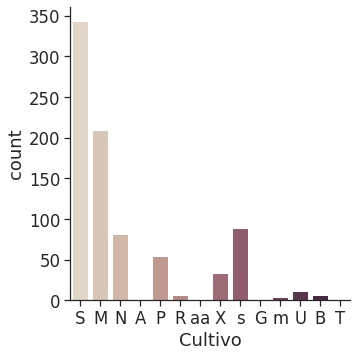

In [ ]:
sns.catplot(x="Cultivo", kind="count", palette="ch:.25", data=train_df)

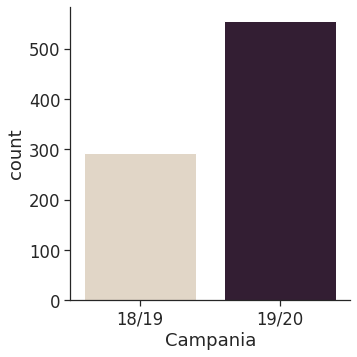

In [ ]:
sns.catplot(x="Campania", kind="count", palette="ch:.25", data=train_df)

Observaciones:

- Se declaran 24 tipos de cultivos (clases), no obstante el dataset de entranmiento sólo tiene 14 de ellos (y un NaN).
- Además, está significativamente desbalanceado en favor de la soja e involucra más datos de la Campaña 19/20 que 18/19.
Es posible compensar el desbalance de las clases conocidas agregando maś muestras, pero el clasificador estará limitado a reconocer sólo las 14 clases para las que fue entrenado y eventualmente una quinceava clase que sea "Desconocido", que será el valor devuelto cuando la probabilidad de las conocidas no supere un umbral mínimo.

### Curvas de principales índices espectrales por campaña y tipo de cultivo

Es de interés analizar las fechas en las que cada tipo de cultivo tiene valores altos de NDVI para elegir las imagenes de estas fechas. Esto se hará para facilitar la detección de features en las imágenes para cada tipo de cultivo y campaña.

Nota: esto se hace tomando la primera muestra para cada par cultivo/campaña, lo que no es del todo correcto. Sería conveniente promediar para varias muestras.

Bandas Landsat8

Banda | Descripción
--- | ---
1   | Coastal aerosol 0.43-0.45 30
2   | Blue 0.45-0.51 30
3   | Green 0.53-0.59 30
4   | Red 0.64-0.67 30
5   | Near Infrared (NIR) 0.85-0.88 30
6   | SWIR 1 1.57-1.65 30
7   | SWIR 2 2.11-2.29 30
8   | Panchromatic 0.50-0.68 15
9   | Cirrus 1.36-1.38 30
10  | Thermal Infrared (TIRS) 1 10.6-11.19 100
11  | Thermal Infrared (TIRS) 2 11.50-12.51 100

NDVI (Normalized Difference Vegetation Index)

$$
NDVI = \frac{\rho_{NIR} - \rho_R}{\rho_{NIR} + \rho_R}
$$

In [ ]:
# Normalized Difference Vegetation Index (NDVI):
# NDVI (Landsat 8) = (B5 – B4) / (B5 + B4)
# NDVI (Sentinel 2) = (B8 – B4) / (B8 + B4)
def ndvi(x):
    try:
        return (x['B5'] - x['B4']) / (x['B5'] + x['B4'])
    except:
        pass

EVI (Enhanced Vegetation Index)

$$
EVI = \frac{\rho_{NIR} - \rho_R}{\rho_{NIR} + 6\rho_R - 7.5\rho_B + 1}
$$

In [ ]:
# Enhanced Vegetation Index (EVI):

# EVI (Landsat 8) = 2.5 * ((B5 – B4) / ((B5 + 6 * B4 – 7.5 * B2) + 1))
# EVI (Sentinel 2) = 2.5 * (B8 – B4) / ((B8 + 6 * B4 – 7.5 * B2) + 1))
def evi(x):
    try:
        return (2.5 * ((x['B5'] - x['B4']) / ((x['B5'] + 6 * x['B4'] - 7.5 * x['B2']) + 1)))
    except:
        pass

In [ ]:
# Soil Adjusted Vegetation Index (SAVI):
#SAVI (Landsat 8) = ((B5 – B4) / (B5+ B4 + 0,5)) * (1,5)
#SAVI (Sentinel 2) = (B08 – B04) / (B08 + B04 + 0,428) * (1,428)
def savi(x):
  try:
      return ((x['B5']-x['B4'])/(x['B5']+x['B4']+0.5))*1.5
  except:
      pass

In [ ]:
# Normalized Difference Moisture Index (NDMI):
# NDMI (Landsat 8) = (B5 – B6) / (B5 + B6)
# NDMI (Sentinel 2) = (B8 – B11) / (B8 + B11)
def ndmi(x):
  try:
      return (x['B5']-x['B6'])/(x['B5']+x['B6'])
  except:
      pass

In [ ]:
# Moisture Stress Index (MSI):
# MSI (Landsat 8) = B6 / B5
# MSI (Sentinel 2) = B11 / B08
def msi(x):
  try:
      return x['B6']/x['B5']
  except:
      pass

In [ ]:
# Green Coverage Index (GCI):
# GCI (Landsat 8) = (B5 / B3) -1
# GCI (Sentinel 2) = (B9 / B3) -1
def gci(x):
  try:
      return (x['B5']/x['B3'])-1
  except:
      pass

In [ ]:

# NDWI (Landsat 8) = (B3 – B5) / (B3 + B5)
# NDWI (Sentinel 2) = (B3 – B8) / (B3 + B8)
def ndwi(x):
  try:
      return (x['B3']-x['B5'])/(x['B3']+x['B5'])
  except:
      pass

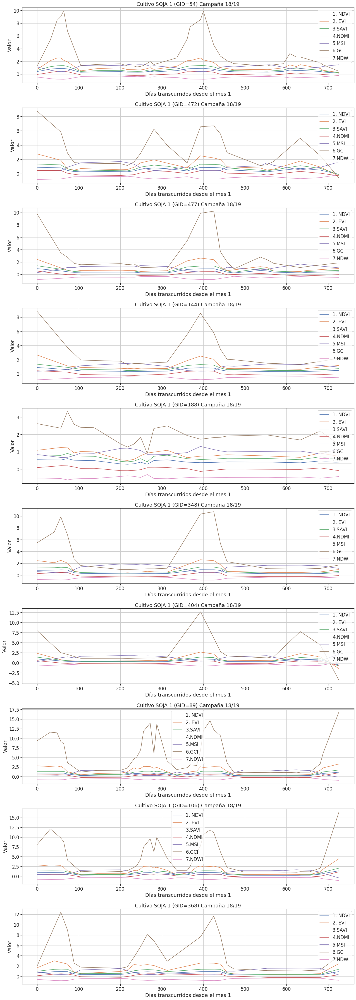

<Figure size 432x288 with 0 Axes>

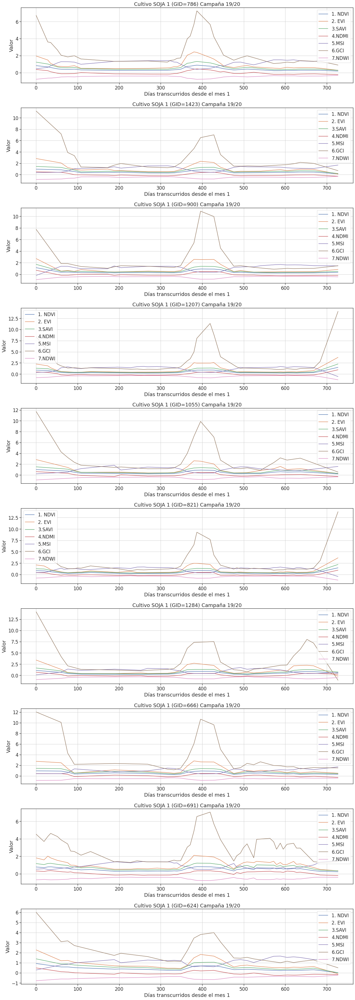

No hay suficientes muestras (1) para 1 18/19


<Figure size 432x288 with 0 Axes>

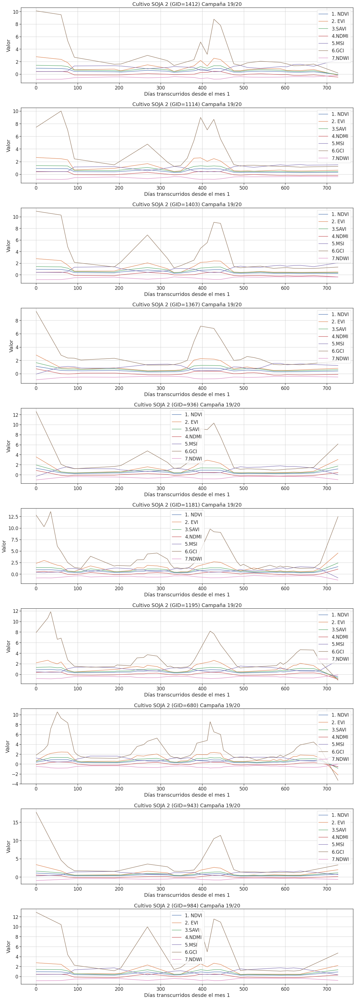

<Figure size 432x288 with 0 Axes>

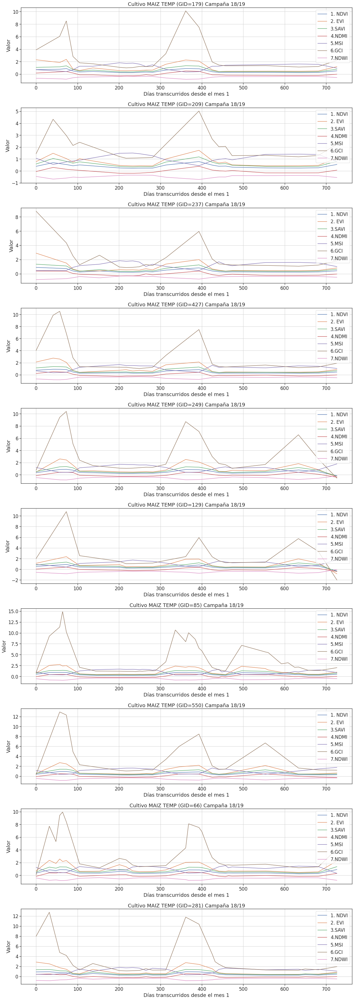

<Figure size 432x288 with 0 Axes>

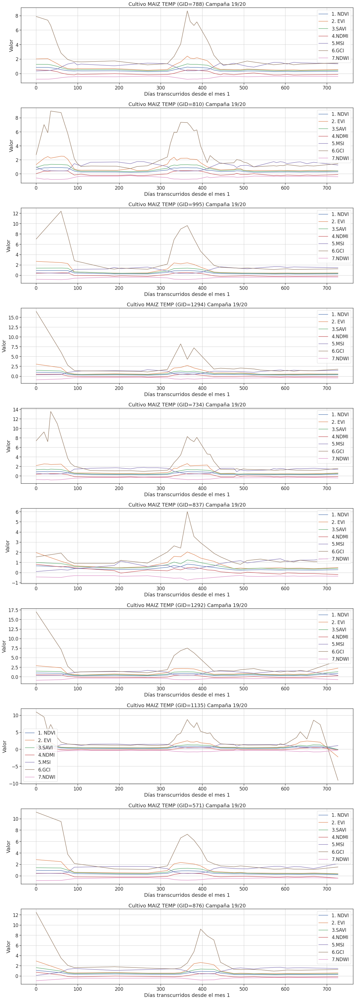

No hay suficientes muestras (1) para 3 18/19


<Figure size 432x288 with 0 Axes>

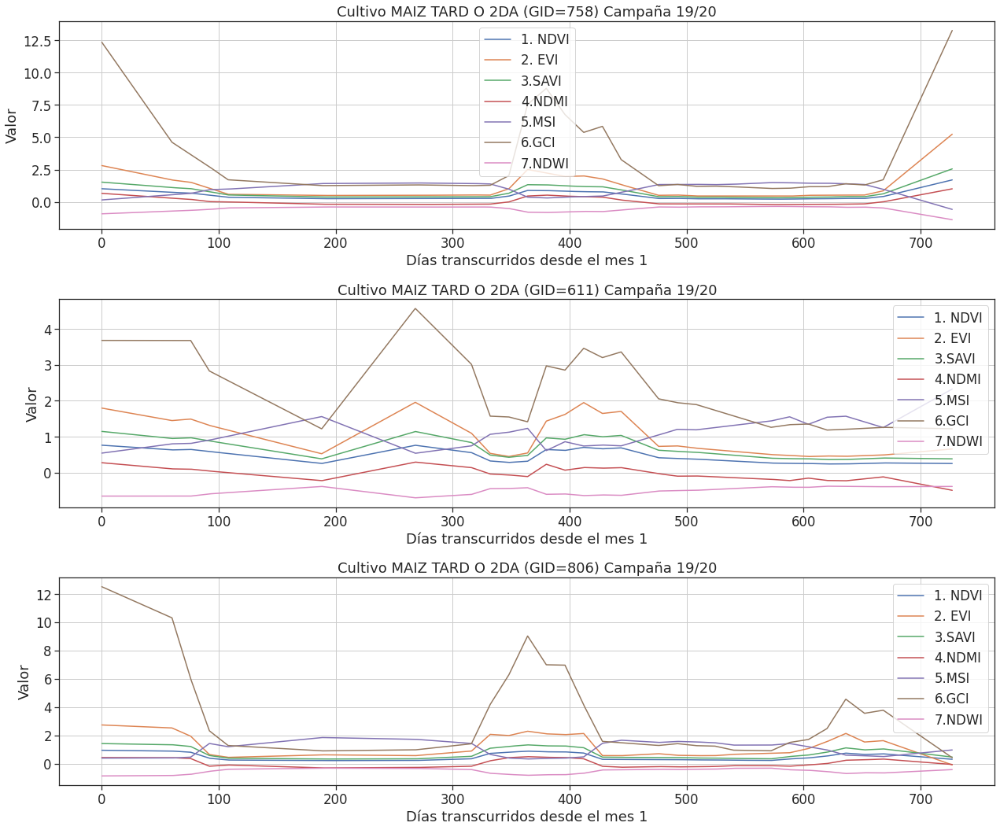

No hay suficientes muestras (0) para 4 18/19


<Figure size 432x288 with 0 Axes>

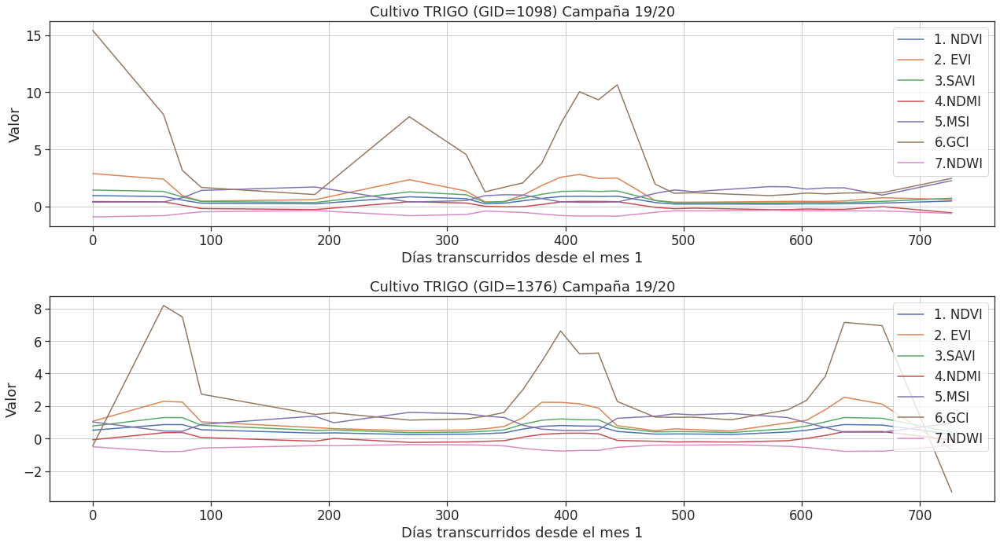

No hay suficientes muestras (1) para 5 18/19
No hay suficientes muestras (0) para 5 19/20


<Figure size 432x288 with 0 Axes>

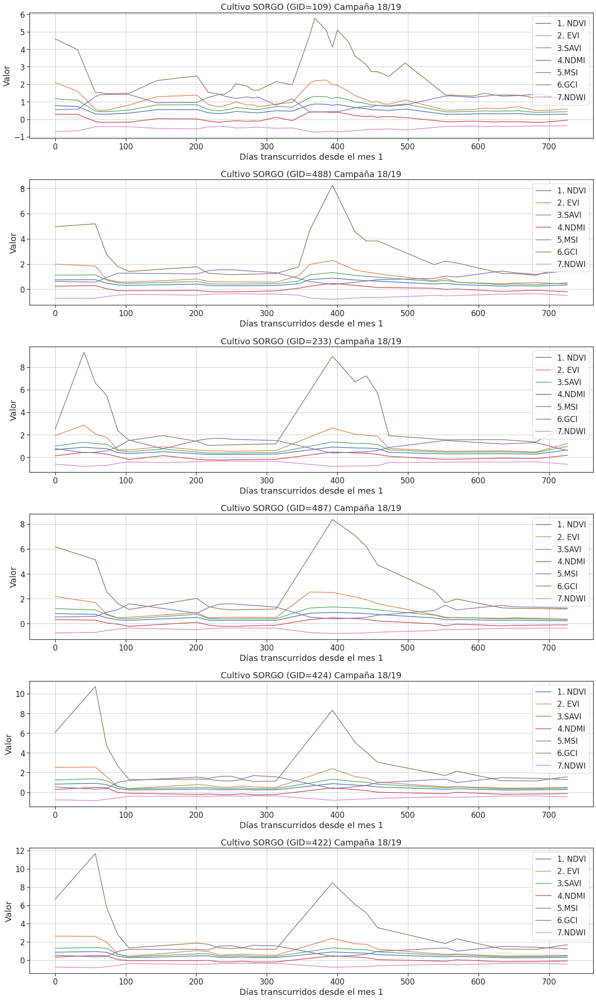

No hay suficientes muestras (0) para 6 19/20


<Figure size 432x288 with 0 Axes>

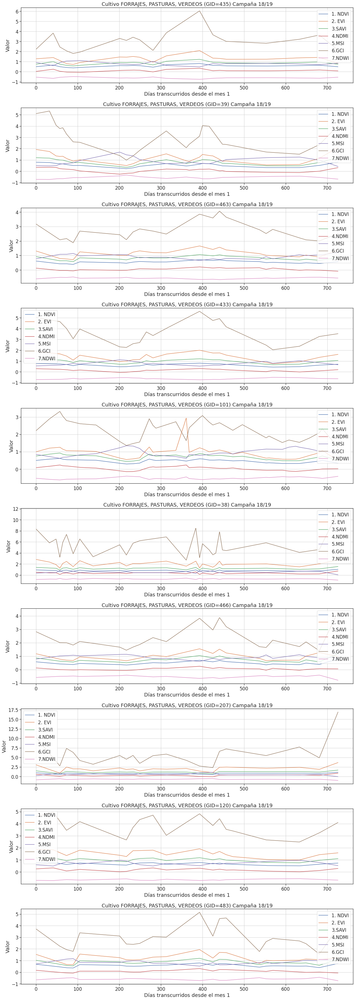

<Figure size 432x288 with 0 Axes>

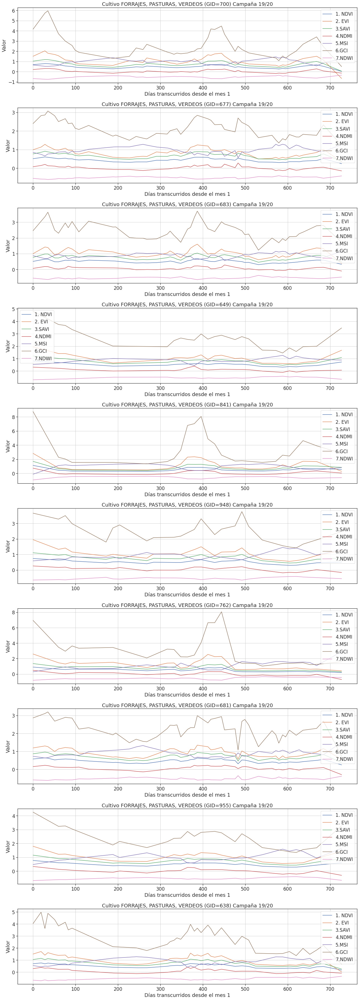

<Figure size 432x288 with 0 Axes>

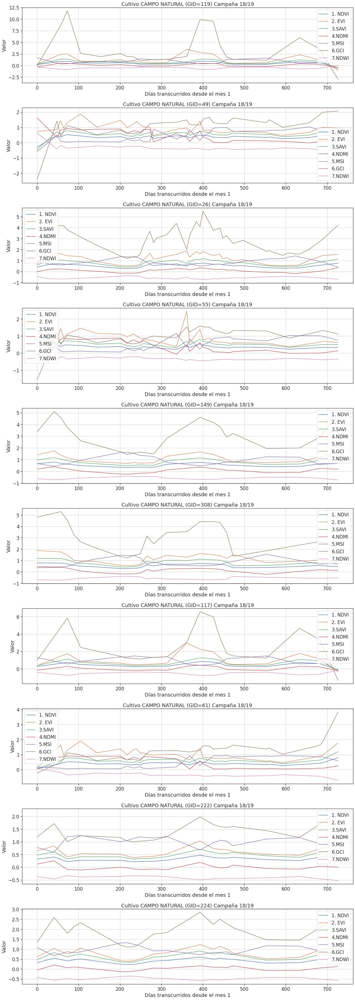

<Figure size 432x288 with 0 Axes>

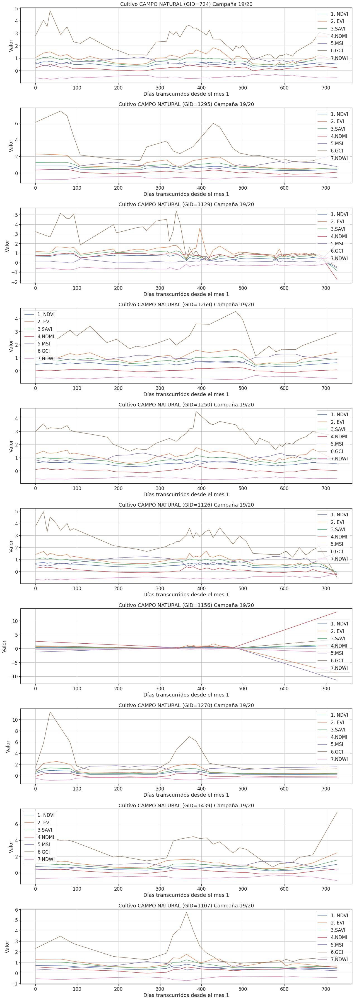

No hay suficientes muestras (0) para 9 18/19


<Figure size 432x288 with 0 Axes>

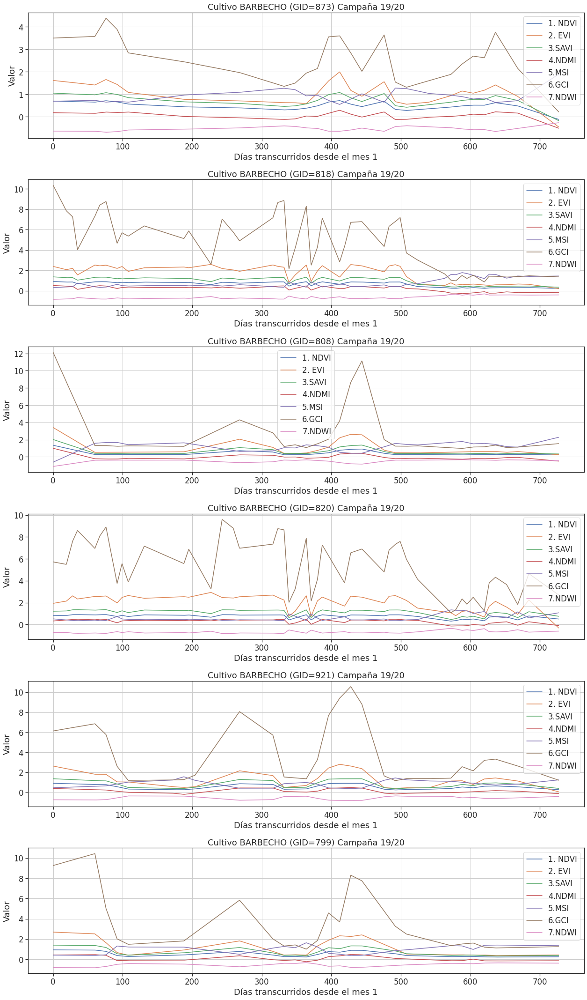

No hay suficientes muestras (1) para 10 18/19
No hay suficientes muestras (1) para 10 19/20


<Figure size 432x288 with 0 Axes>

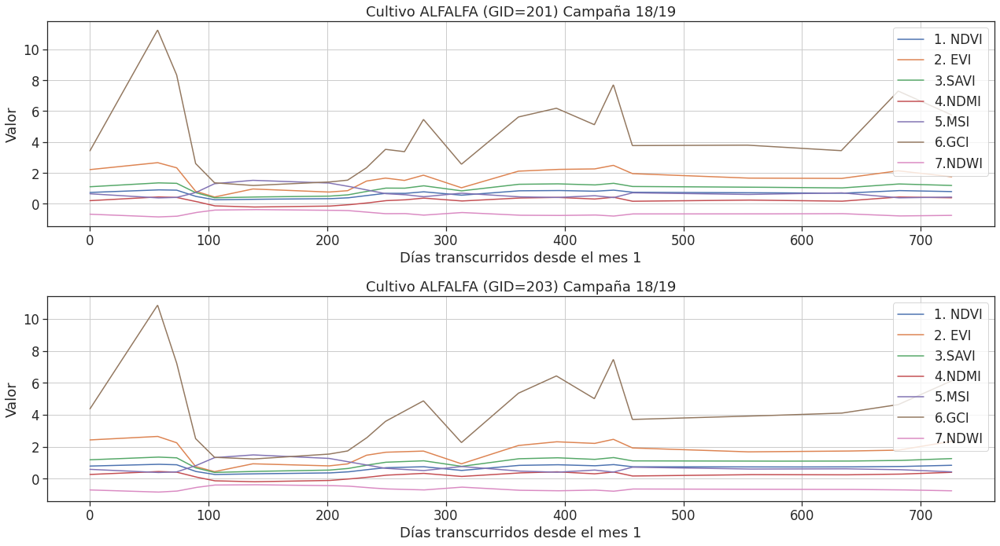

No hay suficientes muestras (0) para 11 19/20


<Figure size 432x288 with 0 Axes>

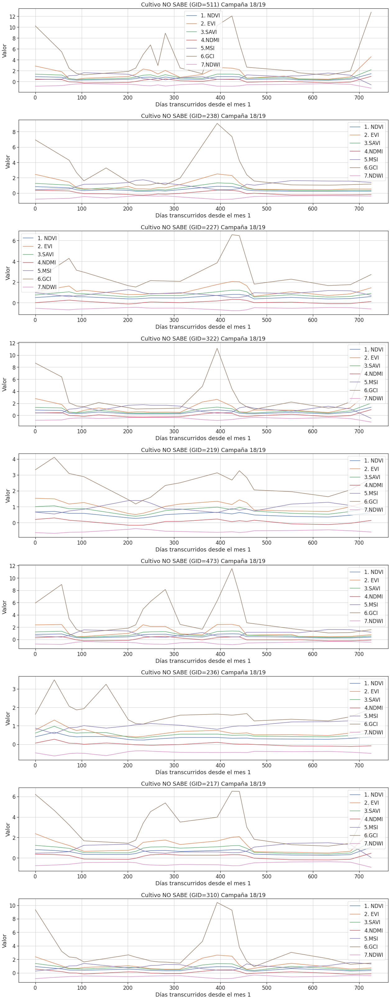

<Figure size 432x288 with 0 Axes>

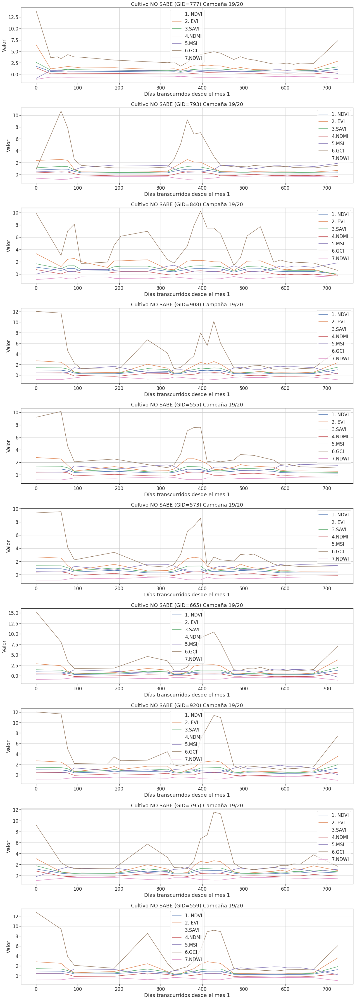

No hay suficientes muestras (0) para 13 18/19


<Figure size 432x288 with 0 Axes>

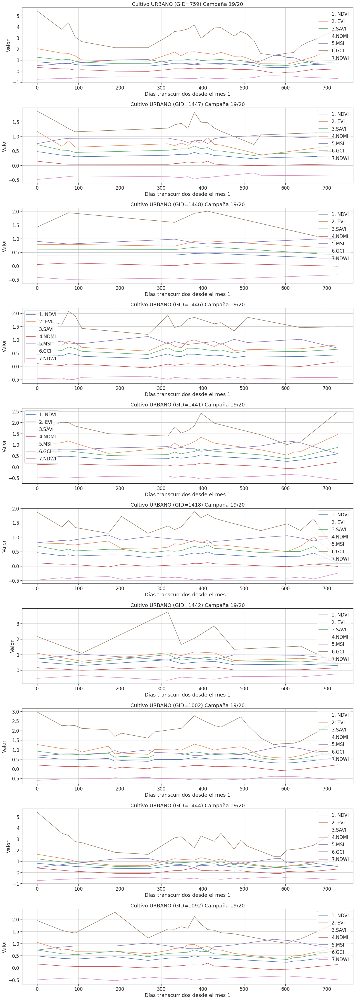

<Figure size 432x288 with 0 Axes>

In [ ]:
#Check 
from scipy.interpolate import interp1d

from datetime import datetime 


def get_ndvi_time_series2(row,start_month=10,end_month=6,radius=500,stats="mean"):
  campaign = row['Campania']   
  year0 = int(campaign.split("/")[0])
  year1 = int(campaign.split("/")[1])
  ts0 = (datetime.combine(datetime(2000+year0, start_month, 1), datetime.min.time()).timestamp()/ 60 / 60 / 24)
  ts1 = (datetime.combine(datetime(2000+year1, end_month, 28), datetime.min.time()).timestamp()/ 60 / 60 / 24)
  raw_dict = ts_extract(lon=row['Longitud'], lat=row['Latitud'], sensor='LC8',
                      start=datetime(2000+year0, start_month, 1), 
                      end=datetime(2000+year1, end_month, 1),
                      bands =  ['B2', 'B3', 'B4', 'B5', 'B6', 'B7'],
                      radius=radius,
                      stats=stats)

  #[get_date(d['id']) for d in raw_dict]
  x_dates = np.array([get_date(d['id']) for d in raw_dict])
  y = np.array([[(datetime.combine(get_date(d['id']), datetime.min.time()).timestamp()/ 60 / 60 / 24) - ts0 for d in raw_dict],
                [ndvi(d) for d in raw_dict],
                [evi(d) for d in raw_dict],
                [savi(d) for d in raw_dict],
                [ndmi(d) for d in raw_dict],
                [msi(d) for d in raw_dict],
                [gci(d) for d in raw_dict],
                [ndwi(d) for d in raw_dict]
  ],dtype=float).T

  # Remover NaNs 
  y = y[~np.any(np.isnan(y),axis=1)]

  # Remover fechas duplicadas
  y_unique, y_unique_index = np.unique(y[:,0], axis=0, return_index=True)
  y = y[y_unique_index]
  x_dates = x_dates[y_unique_index]
  m = int(ts1-ts0)
  return x_dates,y,m

def perform_time_series_analysis(df,start_month=10,end_month=6,radius=50,stats="mean",
                                 poly_interpolation="nearest",figname=""):
  n_rows = len(df)
  if n_rows>30:
    n_rows=30
  
  fig, axes = plt.subplots(n_rows,1,figsize=(18,5*n_rows))
  #fig.suptitle("Series temporales de índices")

  for i in range(n_rows):  
    # Get array and polyfit
    row = df.iloc[i,:]
    x_dates,y,m = get_ndvi_time_series2(row,start_month,end_month,radius,stats)
    #print(m)
    #z = np.polyfit(x, y, 3)
    #p = np.poly1d(z)
    t = np.linspace(0,m,2048)    
    #InterpolatedUnivariateSpline(xi, yi, k=order)
    poly_interpolation = "slinear"
    ndvi = interp1d(y[:,0], y[:,1], kind=poly_interpolation,fill_value="extrapolate")
    evi = interp1d(y[:,0], y[:,2], kind=poly_interpolation,fill_value="extrapolate")
    savi = interp1d(y[:,0], y[:,3], kind=poly_interpolation,fill_value="extrapolate")
    ndmi = interp1d(y[:,0], y[:,4], kind=poly_interpolation,fill_value="extrapolate")
    msi = interp1d(y[:,0], y[:,5], kind=poly_interpolation,fill_value="extrapolate")
    cgi = interp1d(y[:,0], y[:,6], kind=poly_interpolation,fill_value="extrapolate")
    ndwi = interp1d(y[:,0], y[:,7], kind=poly_interpolation,fill_value="extrapolate")

    # Plot    
    axes[i].plot(t,ndvi(t),"-")
    axes[i].plot(t,evi(t),"-")
    axes[i].plot(t,savi(t),"-")
    axes[i].plot(t,ndmi(t),"-")
    axes[i].plot(t,msi(t),"-")
    axes[i].plot(t,cgi(t),"-")
    axes[i].plot(t,ndwi(t),"-")

    axes[i].grid(which='Both') 
    axes[i].legend(["1. NDVI","2. EVI","3.SAVI","4.NDMI","5.MSI","6.GCI","7.NDWI"])
    axes[i].set_xlabel("Días transcurridos desde el mes %d" % start_month)
    axes[i].set_ylabel("Valor")
    axes[i].set_title("Cultivo %s (GID=%d) Campaña %s" % (row['Tipo'], row["GlobalId"], row["Campania"]) )
    
       
    #axes[i][0].plot(t,p(t),"-",color="red")
    
    #axes[i][0].set_ylim(-2,2)
  
  
    # Hist
    #axes[i][1].hist(y[:,1], histtype='step')
    #axes[i][1].hist(y[:,2], histtype='step')
    #axes[i][1].hist(y[:,3], histtype='step')
    #axes[i][1].hist(y[:,4], histtype='step')
    #axes[i][1].hist(y[:,5], histtype='step')
    #axes[i][1].hist(y[:,6], histtype='step')
    #axes[i][1].hist(y[:,7], histtype='step')
    #axes[i][1].legend(["1. NDVI","2. EVI","3.SAVI","4.NDMI","5.MSI","6.GCI","7.NDWI"])
    #axes[i][1].grid(which='Both')
    #axes[i][1].set_ylabel("Frec.")
    #axes[i][1].set_xlabel("Índice")
    #axes[i][1].set_title("Histograma")

  plt.tight_layout()
  plt.show() 
  if figname:
    plt.savefig(figname+".png")
    fig.clear()
#plot_ndvi_anaylisis(train_df[(train_df.Cultivo == "S") & (train_df.Campania=="19/20")].iloc[0:10,:])

df = pd.read_csv(GOOGLE_DRIVE_DATA_PATH+'train_merged_clean.csv')

#for i in range(df.class_idx.max()):

# Campaña 18/19

for class_idx in range(14):
  for campaign in ["18/19","19/20"]:
    #class_idx = 1
    #campaign = "18/19"
    df_filter = (df.class_idx==class_idx) & (df.Campania==campaign)  
    n_samples = len(df[df_filter])
    if n_samples > 10: 
      n_samples = 10
    if n_samples >= 2:      
      sample_df = df[df_filter].sample(n_samples)
      perform_time_series_analysis(sample_df,start_month=1,end_month=12,radius=100,stats="mean",
                                   figname="cid_%d_%s" % (class_idx, campaign[0:2]))
    else:
      print("No hay suficientes muestras (%d) para %d %s" % (n_samples, class_idx, campaign))

### Visualización de puntos y región de General López

Esta visualización es sólo para desarrollar las primeras intuiciones. Los puntos del datataset provienen de diferentes campañas y la fecha de la imagen satelital no se corresponde con las fechas de cada punto.

Determinación de la región mínima requerida que contenga todos los puntos de train y de test.

In [ ]:
print("Long_min (train): ", test_df['Longitud'].min() )
print("Long_max (train): ", test_df['Longitud'].max() )
print("Lat_min (train): ", test_df['Latitud'].min() )
print("Lat_max (train): ", test_df['Latitud'].max() )

In [ ]:
print("Long_min (test): ", test_df['Longitud'].min() )
print("Long_max (test): ", test_df['Longitud'].max() )
print("Lat_min (test): ", test_df['Latitud'].min() )
print("Lat_max (test): ", test_df['Latitud'].max() )

In [ ]:
long0 = min(test_df['Longitud'].min(), train_df['Longitud'].min() )
long1 = max(test_df['Longitud'].max(), train_df['Longitud'].max() )
lat0 = min(test_df['Latitud'].min(), train_df['Latitud'].min() )
lat1 = max(test_df['Latitud'].max(), train_df['Latitud'].max() )
lat = (lat0+lat1)/2
lon = (long0+long1)/2
print("Long_min: ", long0 )
print("Long_max: ", long1 )
print("Lat_min: ", lat0 )
print("Lat_max: ", lat1 )
print("Lon,lat (punto central):",lon,lat)
boundary_ungs = ee.Geometry.Rectangle([long0, lat0, long1, lat1])

Crear mapa de la zona con Folium.

In [ ]:
import folium
import geehydro
map = folium.Map(location=[lat,lon], zoom_start=9)
map.setOptions('HYBRID') # SATELLITE

Agregar el polígono de interés. 


In [ ]:
import geopandas as gpd
gdf = gpd.read_file("DesafioAgTech2020/dataset/Gral Lopez.shp")
gdf.to_file("region.geojson", driver='GeoJSON')
folium.GeoJson( "region.geojson").add_to(map)

Agregar marcadores para visualizar algunos cultivos del dataset (train).

In [ ]:
marker_labels= {
    "S": [ "Soja", "red"],
    "M": [ "Maiz", "yellow"],
    "N": [ "Campo Natural", "green"],
    "A": [ "Agua", "lightblue"]
}
for k,v in marker_labels.items():
  for x in train_df[train_df.Cultivo == k][['Longitud','Latitud']].iterrows():
    crop_long = x[1][0]
    crop_lat = x[1][1]
    folium.CircleMarker( location=[crop_lat, crop_long], radius=10, 
                        line_color='black',fill_color=v[1], 
                        fill_opacity=0.5,popup="<i>%s</i>" % v[0] ).add_to(map)

In [ ]:
map.add_child(folium.LatLngPopup())
map.add_child(folium.LayerControl())
map

## 3. Preparación del dataset

Se hacen dos tipos de ampliación del dataset recibido:

1. **Agregado de features**: en este caso el objetivo es ampliar el dataset (tanto el de train, el de test) con información obtenida de las imágenes satelitales para cada muestra. La clase *DataframeAugmenter* y la función *augment_dataset()* utilizan el patrón Strategy para implementar distintas estrategias de ampliación de un Dataframe para facilitar la generación de distintas combinaciones de features adicionales.
2. **Agregado de filas**: en este caso, se agregan muestras tomando puntos próximos a los existentes para evitar el overfitting de los clasificadores y compensar los datos desbalanceados.

In [ ]:
import abc 

class DataframeAugmenter(object):
    """ Agrega columnas a un Dataframe
    """
    __metaclass__ = abc.ABCMeta  
    
    @abc.abstractmethod
    def get_features(self):
      """ Debe devolver los nombres de las features adicionales.
      """
      raise NotImplementedError
        
    @abc.abstractmethod
    def process_row(self,row):
      """ Función llamada por apply() de pandas para cada fila. 
          Debe devolver los valores de cada columna adicional.
      """
      raise NotImplementedError

La siguiente función aplica todos los ampliadores recibidos como parámetro a un dataset dado y devuelve el dataset aumentado. Debe usarse para train y test porque las nuevas predicciones requerirán estas nuevas columnas.

In [ ]:
def augment_dataset(df, augmenters):
  """
    df: Dataframe a ampliar
    augmenters: Lista de especializaciones de DataframeAugmenter.
  """
  df_aug = df.copy()
  for aug in augmenters:
    df_aug[aug.get_features()] = df_aug.apply(aug.process_row, axis=1, result_type="expand")   
  return df_aug

### 3.1 Clases para ampliación de dataset

A continuación hay distintas especializaciones de *DataframeAugmenter* que amplían el Dataset con información de distintas fuentes:
- Sentinel2 
- Landsat de GEE
- GeoTIFF, 
- Series temporales de índices.

#### 3.1.1 Bandas de Sentinel2 v1 obtenidas de GEE
Esta función, a partir de una fila del dataset, utiliza la fecha de campaña y la latitud y longitud para obtener una colección de las bandas R,G,B, NIR, SWIR1 y SWIR2 de Sentinel2. Para esa colección calcula el NDVI y construye un mosaico con el valor máximo dentro del percentil 95. Esto último para evitar outliers. Verificar!

In [ ]:
class Sentinel2Features(DataframeAugmenter):

    def __init__(self):
      pass

    @abc.abstractmethod
    def get_features(self):
      return ["S2_B","S2_G","S2_R","S2_NIR","S2_SWIR1","S2_SWIR2","S2_NDVI"]
        
    @abc.abstractmethod
    def process_row(self,row):
      p = ee.Geometry.Point(float(row['Longitud']),float(row['Latitud']))

      # Obtener fechas iniciales y finales
      year0,year1=row['Campania'].split("/")
      start_date="%d-%02d-%02d" % (2000+int(year0),11,1)
      end_date="%d-%02d-%02d" % (2000+int(year1),4,30)

      s2 = ee.ImageCollection("COPERNICUS/S2_SR") \
                        .filterBounds(p) \
                        .filterDate(start_date, end_date) 

      # Computa NDVI y lo agrega a cada imagen de la collection
      s2_with_ndvi = s2.map(self.s2_add_ndvi)     

      # Crea un mosaico con el pixel que tenga el máximo NDVI
      s2_ndvi_qual = s2_with_ndvi.qualityMosaic('ndvi')

      # Selecciona las bandas y se queda con los valores en percentil 95% para evitar outliers

      # 0 B2 = B "S2_B","
      # 1 B3 = G "S2_G"
      # 2 B4 = R ,"S2_R"
      # 3 B8 = NIR ,"S2_NIR"
      # 4 B11 = SWIR1 ,"S2_SWIR1"
      # 5 B12 = SWIR2 ,"S2_SWIR2"
      # 6
      # El valor 10?
      data = s2_ndvi_qual.select(["B2","B3","B4","B8","B11","B12","ndvi"]).reduceRegion( ee.Reducer.percentile([95]), p, 10 ).getInfo()
      return list(data.values())

    def s2_add_ndvi(self,img):
      # Agrega NDVI a una imagen
      red = ee.Image(img.select('B4'))
      nir = ee.Image(img.select('B8'))
      ndvi = (nir.subtract(red)).divide(nir.add(red)).rename('ndvi')
      return img.addBands(ndvi)     

In [ ]:
# Verificación
row = train_df.iloc[0,:]
s2aug = Sentinel2Features()
S2_B,S2_G,S2_R,S2_NIR,S2_SWIR1,S2_SWIR2,S2_NDVI = s2aug.process_row(row)
S2_B,S2_G,S2_R,S2_NIR,S2_SWIR1,S2_SWIR2,S2_NDVI

NameError: ignored

#### 3.1.2 Series Temporales de Landsat8 descargadas de GEE

In [ ]:
class GEELandsat8TimeSeries(DataframeAugmenter):

    def get_indexes_time_series(self,row):      
      campaign = row['Campania']   
      year0 = int(campaign.split("/")[0])
      year1 = int(campaign.split("/")[1])
      ts0 = datetime.combine(datetime(2000+year0, self.start_month, 1), datetime.min.time()).timestamp()/(60*60)
      ts1 = datetime.combine(datetime(2000+year1, self.end_month, 1), datetime.min.time()).timestamp()/(60*60)
      m = int(ts1-ts0)
      raw_dict = ts_extract(lon=row['Longitud'], lat=row['Latitud'], sensor='LC8',
                      start=datetime(2000+year0, self.start_month, 1), 
                      end=datetime(2000+year1, self.end_month, 1),
                      bands =  ['B2', 'B3', 'B4', 'B5', 'B6', 'B7'],
                      radius=self.radius,
                      stats=self.stats)
      
      #x_dates = np.array([get_date(d['id']) for d in raw_dict])
      y = np.array([[datetime.combine(get_date(d['id']), datetime.min.time()).timestamp()/(60*60) - ts0 for d in raw_dict],
                [ndvi(d) for d in raw_dict],
                [evi(d) for d in raw_dict],
                [savi(d) for d in raw_dict],
                [ndmi(d) for d in raw_dict],
                [msi(d) for d in raw_dict],
                [gci(d) for d in raw_dict],
                [ndwi(d) for d in raw_dict]
      ],dtype=float).T

      # Remover NaNs 
      y = y[~np.any(np.isnan(y),axis=1)]

      if y.shape[0] > 2:
        # Remover fechas duplicadas
        y_unique, y_unique_index = np.unique(y[:,0], axis=0, return_index=True)
        y = y[y_unique_index]
        #x_dates = x_dates[y_unique_index]
      else:
        y = None

      return y,m

    def __init__(self,output_path,start_month=10,end_month=6,radius=500,stats="mean",verbose=False):      
      # Crear directorio de salida
      self.output_path = output_path
      if os.path.exists(self.output_path):
        shutil.rmtree(self.output_path)
      os.mkdir( self.output_path )
      self.start_month = start_month
      self.end_month=end_month
      self.radius=radius
      self.stats=stats
      self.n_samples=1024
      self.verbose = verbose
      pass

    @abc.abstractmethod
    def get_features(self):
      return ["ts_filename","n_points"]
        
    @abc.abstractmethod
    def process_row(self,row):
      y,m = self.get_indexes_time_series(row)      

      y_valid = y is not None
      
      if y_valid:
        n_points = y.shape[0]
        t = np.linspace(0,m,self.n_samples)
        ndvi = interp1d(y[:,0], y[:,1], kind='slinear', fill_value="extrapolate")
        evi = interp1d(y[:,0], y[:,2], kind='slinear', fill_value="extrapolate")
        savi = interp1d(y[:,0], y[:,3], kind='slinear', fill_value="extrapolate")
        ndmi = interp1d(y[:,0], y[:,4], kind='slinear', fill_value="extrapolate")
        msi = interp1d(y[:,0], y[:,5], kind='slinear', fill_value="extrapolate")
        cgi = interp1d(y[:,0], y[:,6], kind='slinear', fill_value="extrapolate")
        ndwi = interp1d(y[:,0], y[:,7], kind='slinear', fill_value="extrapolate")

        ts_arr = np.array( [
          ndvi(t),
          evi(t),
          savi(t),
          ndmi(t),
          msi(t),
          cgi(t),
          ndwi(t)
        ]).T
        ts_filename = str(row['GlobalId'])+".pkl"
        full_ts_filename = self.output_path+ts_filename
        with open(full_ts_filename,'wb') as f: pickle.dump(ts_arr, f)
        if self.verbose:
          print(full_ts_filename)
      else:
        print("Salteando GlobalId %d. No hay datos suficientes" % row['GlobalId'])
        full_ts_filename=None
        n_points = None
      return full_ts_filename,n_points

In [ ]:
# Verificación (válido)
row = train_df.iloc[0,:]
tsaug = GEELandsat8TimeSeries(output_path = "./tmp/",verbose = True)
ts_filename,n_points = tsaug.process_row(row)
print(n_points)
with open(ts_filename,'rb') as f: ts_arr = pickle.load(f)
t = np.linspace(0,ts_arr[:,0].max(),1024)
plt.figure(figsize=(22,6))
for i in range(7):
  plt.plot(t,ts_arr[:,i])

In [ ]:
# Verificación (inválido, devuelve None)
row = train_df.iloc[847,:]
tsaug = GEELandsat8TimeSeries(output_path = "./tmp/",verbose = True)
ts_filename,n_points = tsaug.process_row(row)
ts_filename

### 3.2 Agregado de filas

In [ ]:
train_df, class_idx_to_cultivo_id, cultivo_id_to_class_idx = load_train_dataset()
train_df.head()

In [ ]:
# Cantidad de muestras por clase
samples_per_class = {}
for k,v in train_df.class_idx.value_counts().iteritems():
  class_idx = int(k)
  q = v
  samples_per_class[class_idx] = q
samples_per_class

In [ ]:
def generate_random_points_in_area(lat,lon,n,radius = 100):  
  r_earth = 6378000  
  lat_min = lat - (radius / r_earth) * (180.0 / np.pi)
  lat_max = lat + (radius / r_earth) * (180.0 / np.pi)
  lon_min = lon - (radius / r_earth) * (180.0 / np.pi) / np.cos(lat * np.pi/180)
  lon_max = lon + (radius / r_earth) * (180.0 / np.pi) / np.cos(lat * np.pi/180)
  lons = np.random.uniform(low=lon_min, high=lon_max, size=n)
  lats = np.random.uniform(low=lat_min, high=lat_max, size=n)
  return lats,lons

In [ ]:
def generate_new__points_for_class(df, class_idx,total_samples_to_generate):
  global last_global_id
  original_samples = df[df.class_idx == class_idx].sample(samples_per_class[class_idx])    
  n = len(original_samples)
  samples_to_generate_per_original_sample = total_samples_to_generate / n
  if samples_to_generate_per_original_sample < 1.0:
    threeshold = 1.0 - total_samples_to_generate / n
  else:
    threeshold = 0.0
    samples_to_generate_per_original_sample = int(np.ceil(total_samples_to_generate / n))
    
  for i in range(n):    
    row = original_samples.iloc[i,:]
    new_rows=original_samples.iloc[[i],] # Fila a copiar
    
    if threeshold > 0.0 :
      if np.random.rand() >= threeshold:
        lats,lons = generate_random_points_in_area(row['Latitud'],row['Longitud'],1,radius = 100)
        new_rows=new_rows.reindex(new_rows.index.repeat(1)) 
        new_rows.loc[:,'class_idx'] = class_idx
        new_rows.loc[:,'Latitud'] = lats
        new_rows.loc[:,'Longitud'] = lons
        global_ids  = [last_global_id + 1 + i for i in range(1)]
        last_global_id = np.max(global_ids)
        new_rows.loc[:,'GlobalId'] = global_ids
        df = df.append(new_rows)
    else:
      lats,lons = generate_random_points_in_area(row['Latitud'],row['Longitud'],samples_to_generate_per_original_sample,radius = 100)
      new_rows=new_rows.reindex(new_rows.index.repeat(samples_to_generate_per_original_sample)) 
      new_rows.loc[:,'class_idx'] = class_idx
      new_rows.loc[:,'Latitud'] = lats
      new_rows.loc[:,'Longitud'] = lons
      global_ids = [last_global_id + 1 + i for i in range(samples_to_generate_per_original_sample)]
      last_global_id = np.max(global_ids)
      new_rows.loc[:,'GlobalId'] = global_ids
      df = df.append(new_rows)
  return df
    
# Balancear una clase
#class_to_balance = 5
#samples_to_generate = minimum_samples - samples_per_class[class_to_balance]
#generate_new__points_to_class
train_df_tmp = train_df.copy()
last_global_id = train_df_tmp['GlobalId'].max()
minimum_samples_per_class = 600
for class_idx in samples_per_class.keys():  
  train_df_tmp = generate_new__points_for_class(train_df_tmp,class_idx,minimum_samples_per_class - samples_per_class[class_idx])
sns.catplot(x="Cultivo", kind="count", palette="ch:.25", data=train_df_tmp) 

In [ ]:
len(train_df_tmp)

In [ ]:
train_df_tmp.to_csv(GOOGLE_DRIVE_DATA_PATH+'train_added_rows8538.csv')

In [ ]:
np.any(train_df_tmp['GlobalId'].duplicated())

### 3.3 Datasets ampliados con nuevas features

#### 3.2.1 Dataset ampliado con bandas de Sentinel2 v1

In [ ]:
if not os.path.exists(GOOGLE_DRIVE_DATA_PATH+'train_s2_v1.csv'):
  train_df_aug = augment_dataset(train_df,[Sentinel2Features()])
  train_df_aug.to_csv(GOOGLE_DRIVE_DATA_PATH+'train_s2_v1.csv')
  train_df_aug
else:
  print("El dataset ya fue generado y no se regeneró.")

In [ ]:
train_df = pd.read_csv(GOOGLE_DRIVE_DATA_PATH+'train_added_rows8538.csv')
if not os.path.exists(GOOGLE_DRIVE_DATA_PATH+'train8538_s2_v1.csv'):
  train_df_aug = augment_dataset(train_df,[Sentinel2Features()])
  train_df_aug.to_csv(GOOGLE_DRIVE_DATA_PATH+'train8538_s2_v1.csv')
  train_df_aug
else:
  print("El dataset ya fue generado y no se regeneró.")

#### 3.2.2 Dataset ampliado con series temporales para diversos índices obtenidas de Landsat8 con GEE almacenadas con Pickle en archivos externos.

## 4. Ingeniería de Features Básica

Nota: esta sección es para las features de estadísticas, no aplica para los parches de entrada de la CNN.

Se particiona el dataset de entrenamiento para tener una métrica preliminar de desempeño antes de realizar la submisión del dataset de test.


## 5. Desarrollo y Entrenamiento del Modelo Presentado

### 5.1 Métricas de evaluación

In [ ]:
from tensorflow import keras
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import pickle
from tensorflow import keras
from datetime import datetime
from keras.models import load_model

In [ ]:
class BalancedSparseCategoricalAccuracy(keras.metrics.SparseCategoricalAccuracy):
    def __init__(self, name='balanced_sparse_categorical_accuracy', dtype=None):
        super().__init__(name, dtype=dtype)

    def update_state(self, y_true, y_pred, sample_weight=None):
        y_flat = y_true
        if y_true.shape.ndims == y_pred.shape.ndims:
            y_flat = tf.squeeze(y_flat, axis=[-1])
        y_true_int = tf.cast(y_flat, tf.int32)

        cls_counts = tf.math.bincount(y_true_int)
        cls_counts = tf.math.reciprocal_no_nan(tf.cast(cls_counts, self.dtype))
        weight = tf.gather(cls_counts, y_true_int)
        return super().update_state(y_true, y_pred, sample_weight=weight)

### 5.2 Entrenamiento del modelo

In [ ]:
with open(GOOGLE_DRIVE_DATA_PATH+'class_idx_to_cultivo_id.pkl', 'rb') as f:
  class_idx_to_cultivo_id = pickle.load(f)
with open(GOOGLE_DRIVE_DATA_PATH+'cultivo_id_to_class_idx.pkl', 'rb') as f:
  cultivo_id_to_class_idx = pickle.load(f)  

NUM_CLASSES = len(class_idx_to_cultivo_id)
NUM_CLASSES

In [ ]:
!tar -xf drive/MyDrive/train_ds_timeseries2.tar.gz ./train_timeseries2/

In [ ]:
SAMPLE_SIZE = 1024
CLIPPED_SAMPLE_SIZE = 800-400

df = pd.read_csv(GOOGLE_DRIVE_DATA_PATH+'train8538_pickle_timeseries2.csv')
df.dropna(inplace=True)
df.head(5)

In [ ]:
total_samples = len(df)
X = np.zeros(shape=(total_samples,SAMPLE_SIZE,7))
#X = np.zeros(shape=(total_samples,CLIPPED_SAMPLE_SIZE,7))
y = np.zeros(total_samples)
for i in range(total_samples):
  row = df.iloc[i,:]
  with open(row['ts_filename'],'rb') as f: 
    a = pickle.load(f)
    X[i] = a[400:800,:]  
  y[i] = row['class_idx']  
X.shape,y.shape  

In [ ]:
from keras.models import Sequential
from keras.layers import Conv1D,Dropout,MaxPooling1D,Flatten,Dense

def make_model(input_shape):
  model = Sequential()
  
  # Conv1
  model.add(Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=input_shape))
  model.add(Dropout(0.5))
  model.add(MaxPooling1D(pool_size=2))

  # Conv2
  model.add(Conv1D(filters=64, kernel_size=3, activation='relu'))
  model.add(Dropout(0.5))
  model.add(MaxPooling1D(pool_size=2))

  model.add(Flatten())
  model.add(Dense(128, activation='relu'))
  model.add(Dense(NUM_CLASSES, activation='softmax'))
  return model


model = make_model(input_shape=x_train.shape[1:])
keras.utils.plot_model(model, show_shapes=True)

In [ ]:
def make_model2(input_shape):
    input_layer = keras.layers.Input(input_shape)

    conv1 = keras.layers.Conv1D(filters=64, kernel_size=3, padding="same")(input_layer)
    conv1 = keras.layers.BatchNormalization()(conv1)
    conv1 = keras.layers.ReLU()(conv1)

    conv2 = keras.layers.Conv1D(filters=64, kernel_size=3, padding="same")(conv1)
    conv2 = keras.layers.BatchNormalization()(conv2)
    conv2 = keras.layers.ReLU()(conv2)

    conv3 = keras.layers.Conv1D(filters=64, kernel_size=3, padding="same")(conv2)
    conv3 = keras.layers.BatchNormalization()(conv3)
    conv3 = keras.layers.ReLU()(conv3)

    gap = keras.layers.GlobalAveragePooling1D()(conv3)

    output_layer = keras.layers.Dense(NUM_CLASSES, activation="softmax")(gap)

    return keras.models.Model(inputs=input_layer, outputs=output_layer)


model = make_model(input_shape=x_train.shape[1:])
keras.utils.plot_model(model, show_shapes=True)

In [ ]:
import tensorflow as tf
num_epochs = 15
batch_size = 32

callbacks = [
    keras.callbacks.ModelCheckpoint(
        "best_1dcnn_model.h5", save_best_only=True, monitor="val_loss"
    ),
    keras.callbacks.ReduceLROnPlateau(
        monitor="val_loss", factor=0.5, patience=5, min_lr=0.0001
    ),
    keras.callbacks.EarlyStopping(monitor="val_loss", patience=50, verbose=1),
]
model = make_model(input_shape=x_train.shape[1:])
model.compile(    
    optimizer = keras.optimizers.Adam(),
    #optimizer = keras.optimizers.SGD(lr=0.0001, decay=1e-4, momentum=0.9, nesterov=True),
    loss="sparse_categorical_crossentropy",    
    metrics= [BalancedSparseCategoricalAccuracy()]
)
history = model.fit(
    x_train,
    y_train,
    batch_size=batch_size,
    epochs=num_epochs,
    callbacks=callbacks,
    validation_split=0.2,
    verbose=1,
)

In [ ]:
from sklearn.metrics import balanced_accuracy_score 

y_pred_val = np.argmax(model.predict(x_val), axis=1)
balanced_accuracy_score(y_val, y_pred_val)

## 6. Resultados y conclusiones

## 7. Preparación de submisión para evaluación

- Subir resultados: https://metadata.fundacionsadosky.org.ar/upload/22/
- Leaderboard: https://metadata.fundacionsadosky.org.ar/competition/22/

In [ ]:
!tar -xf drive/MyDrive/test_ds_timeseries2.tar.gz ./test_timeseries2/

In [ ]:
test_df = pd.read_csv(GOOGLE_DRIVE_DATA_PATH+'test_pickle_timeseries2.csv')
  
def map_class_idx_to_cultivo_id(row):
  return class_idx_to_cultivo_id[row['class_idx']]

total_test_samples = len(test_df)
X_eval= np.zeros(shape=(total_test_samples,CLIPPED_SAMPLE_SIZE,7))
for i in range(total_test_samples):
  row = test_df.iloc[i,:]
  with open(row['ts_filename'],'rb') as f: 
    a = pickle.load(f)
    X_eval[i] = a[400:800,:]  

X_eval = scaler.fit_transform(X_eval.reshape(-1, X_eval.shape[-1])).reshape(X_eval.shape)

#t = np.arange(0,SAMPLE_SIZE)
t = np.arange(0,CLIPPED_SAMPLE_SIZE)
plt.figure(figsize=(18,4))
plt.grid(which="Both")
for i in range(7):
  plt.plot(t,X_eval[9,:,i])

In [ ]:
from datetime import datetime

def map_class_idx_to_cultivo_id(row):
  return class_idx_to_cultivo_id[row['class_idx']]

def predict_with_model_and_prepare_submission():
  model = load_model('best_1dcnn_model.h5', custom_objects ={'BalancedSparseCategoricalAccuracy': BalancedSparseCategoricalAccuracy})
  y_pred = np.argmax(model.predict(X_eval), axis=1)
  df_submission = test_df.copy()
  df_submission["class_idx"] = y_pred
  df_submission['CultivoId'] = df_submission.apply(map_class_idx_to_cultivo_id, axis=1, result_type="expand") 

  FILENAME = "submit_CNN1D_%s.csv" %  datetime.now().strftime("%m_%d_%Y_%H_%M_%S")
  df_submission[["GlobalId","CultivoId"]].to_csv(FILENAME, index=False,header=False)
  print("Generado %s" % FILENAME)
  return df_submission,y_pred

df_submission,y_pred =  predict_with_model_and_prepare_submission()
df_submission.head(50)